In [2]:
  !pip install -Uqq fastai

In [3]:
!pip uninstall torch torchvision
!pip install torch torchvision





Found existing installation: torch 2.0.1+cu118
Uninstalling torch-2.0.1+cu118:
  Would remove:
    /usr/local/bin/convert-caffe2-to-onnx
    /usr/local/bin/convert-onnx-to-caffe2
    /usr/local/bin/torchrun
    /usr/local/lib/python3.10/dist-packages/functorch/*
    /usr/local/lib/python3.10/dist-packages/nvfuser/*
    /usr/local/lib/python3.10/dist-packages/torch-2.0.1+cu118.dist-info/*
    /usr/local/lib/python3.10/dist-packages/torch/*
    /usr/local/lib/python3.10/dist-packages/torchgen/*
Proceed (Y/n)? Y
  Successfully uninstalled torch-2.0.1+cu118
Found existing installation: torchvision 0.15.2+cu118
Uninstalling torchvision-0.15.2+cu118:
  Would remove:
    /usr/local/lib/python3.10/dist-packages/torchvision-0.15.2+cu118.dist-info/*
    /usr/local/lib/python3.10/dist-packages/torchvision.libs/libcudart.60cfec8e.so.11.0
    /usr/local/lib/python3.10/dist-packages/torchvision.libs/libjpeg.ceea7512.so.62
    /usr/local/lib/python3.10/dist-packages/torchvision.libs/libnvjpeg.7053040

In [4]:
from fastai.vision.all import *

In [5]:
#the dataset can be downloaded and decompressed with this line of code
path = untar_data(URLs.PETS)
#it will do this download only once and return the location of decommpressed  archive. we can check inside this with .ls() method

In [6]:
path.ls()

(#2) [Path('/root/.fastai/data/oxford-iiit-pet/images'),Path('/root/.fastai/data/oxford-iiit-pet/annotations')]

In [7]:
#get_image_files is a function that helps us grab all the images files recursively frm one folder
files = get_image_files(path/"images")

In [8]:
len(files)

7390

In [9]:
files[7]

Path('/root/.fastai/data/oxford-iiit-pet/images/Bombay_19.jpg')

#Cats vs dogs

In [10]:
# now we have to label cats and dogs. here files with capital letters are cat images and files with small letters are dogs

#we can then define n easy label function
def label_func(f): return f[0].isupper()


In [11]:
# to get our data ready, we need to put it into dataloaders object. 

dls = ImageDataLoaders.from_name_func(path, files, label_func,item_tfms=Resize(224))


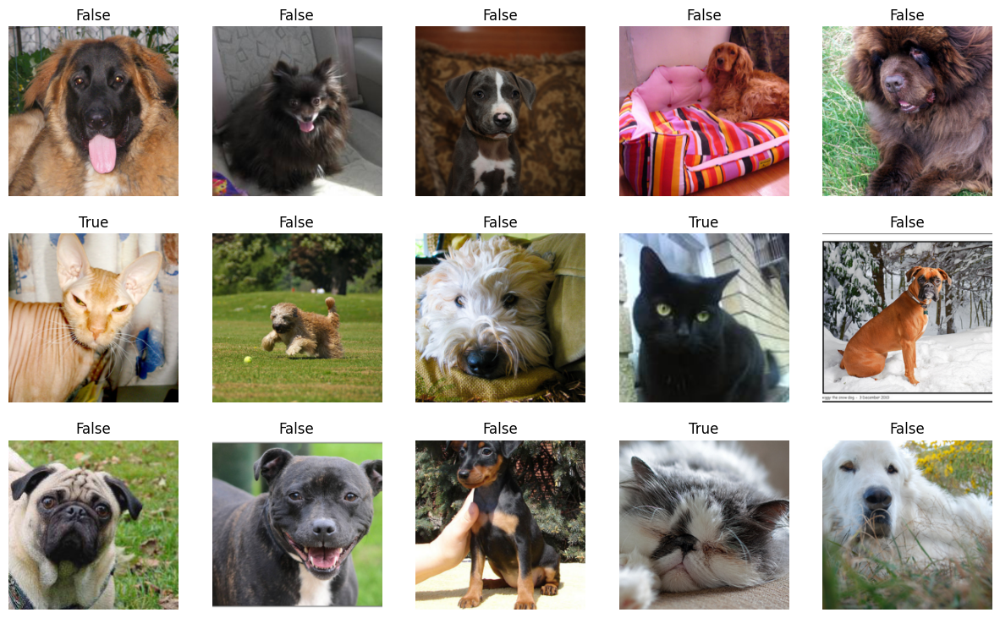

In [12]:
#we can check if everything looks okay with the show_batch method( true for cats and false for images)
dls.show_batch(max_n=15)

In [13]:
pip install --upgrade torch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [14]:
#then we can use a learner , which is a fastai object that combines data and a model for training, 
# and uses transfer learning to fine tune a pretrained model  in just two lines 

learn = vision_learner(dls, resnet34,metrics=error_rate)
learn.fine_tune(0)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:01<00:00, 80.0MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,0.149361,0.023116,0.008119,01:08


In [15]:
learn.predict(files[25])

('False', tensor(0), tensor([1.0000e+00, 3.3802e-06]))

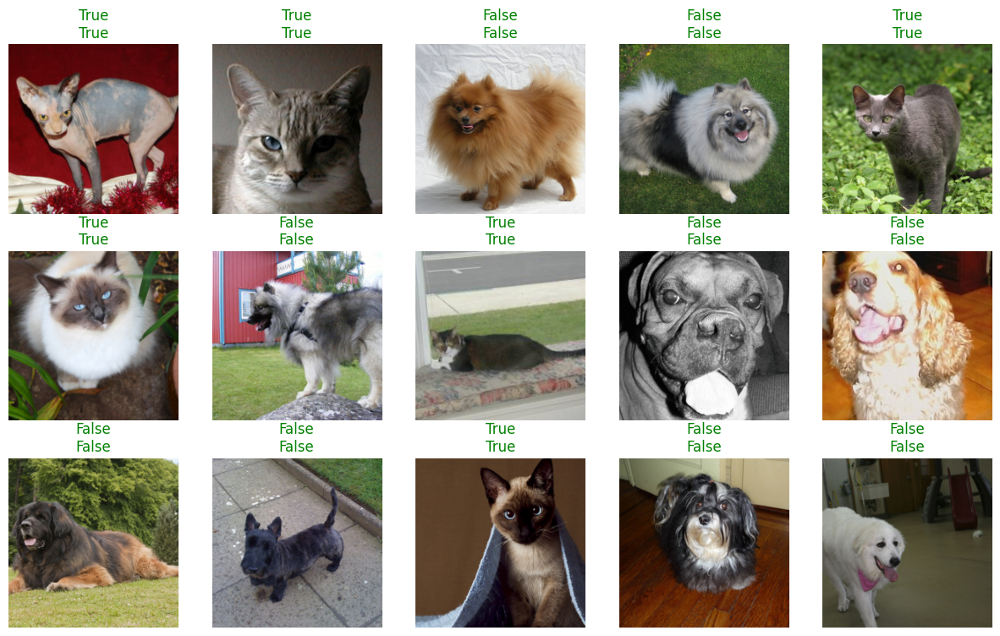

In [16]:
learn.show_results(max_n=15)

#classifying breeds

In [17]:
#to label our data with breed name, we will use a regular expression to extract it from file name. 
files[0].name

'scottish_terrier_106.jpg'

In [18]:
#so the class is everything before the last _ followed by some digits

pattern = r'^(.*)_\d+.jpg'

dls = ImageDataLoaders.from_name_re(path,files,pattern,item_tfms=Resize(224))

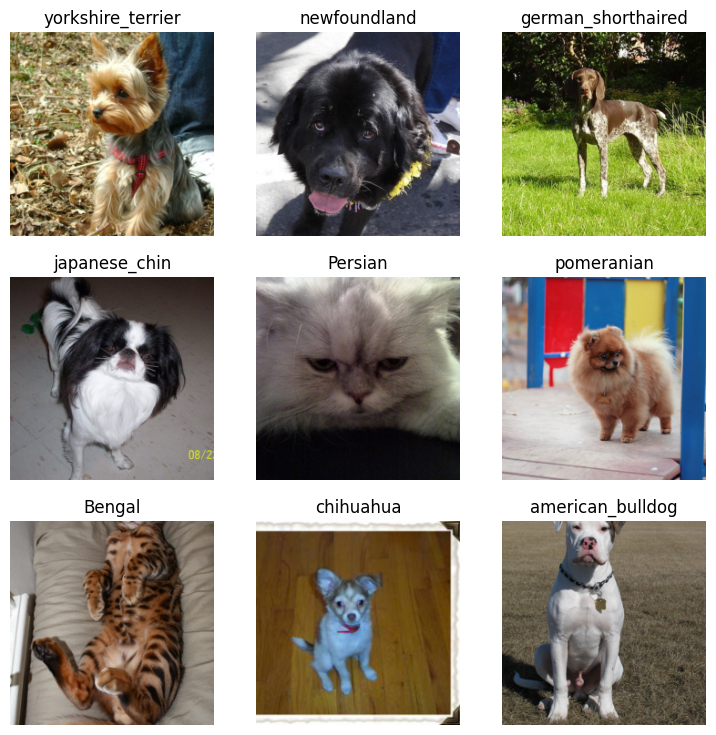

In [19]:
dls.show_batch()

In [20]:
print(torch.cuda.is_available())
!nvcc --version

True
nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0


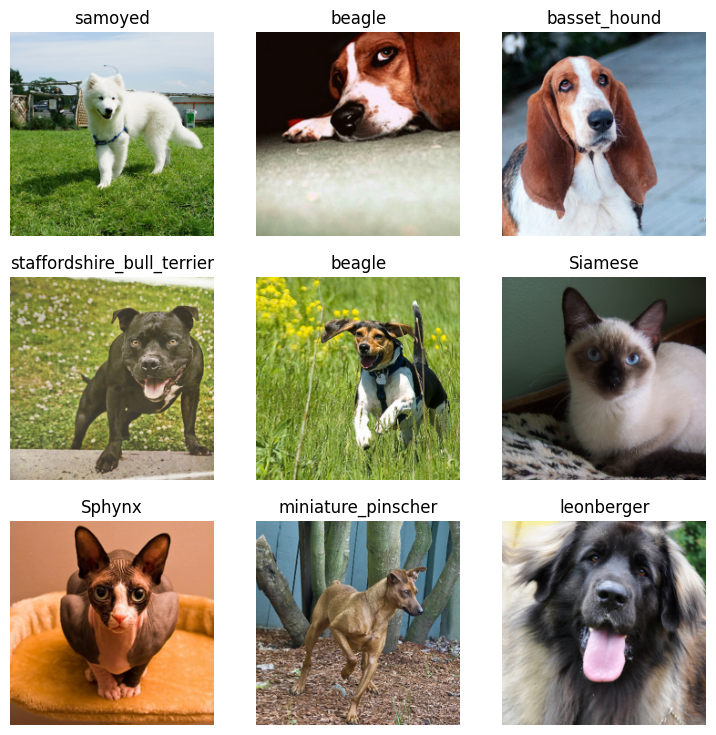

In [21]:
#since classifying between 37 different breeds is a harder problem, we will use data augmentation, changing slightly the dataloaders

dls = ImageDataLoaders.from_name_re(path, files, pattern, item_tfms=Resize(320),batch_tfms=aug_transforms(size=224))

dls.show_batch()

In [22]:
#we can create our learner exactly as before and train the model

learn = vision_learner(dls,resnet34,metrics=error_rate)

SuggestedLRs(valley=0.0005754399462603033)

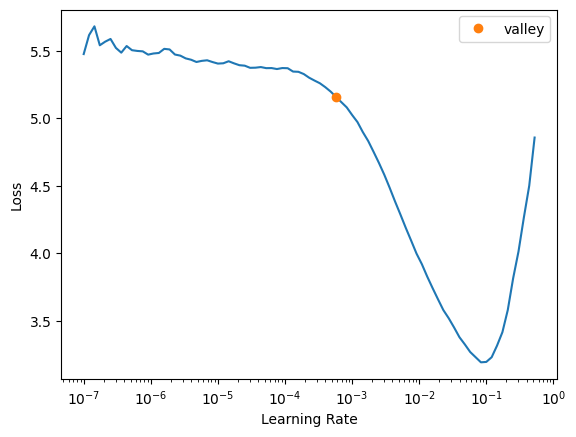

In [23]:
#we were using the default learning rate but we might want to find the best possible one. 
learn.lr_find()


In [24]:
#It plots the graph of the learning rate finder and gives us two suggestions (minimum divided by 10 and steepest gradient). Let’s use 3e-3 here.

In [26]:
learn.fine_tune(2, 0.0005)

epoch,train_loss,valid_loss,error_rate,time
0,0.373469,0.222665,0.062923,01:08


epoch,train_loss,valid_loss,error_rate,time
0,0.291056,0.203558,0.062923,01:12
1,0.230038,0.202225,0.064276,01:13


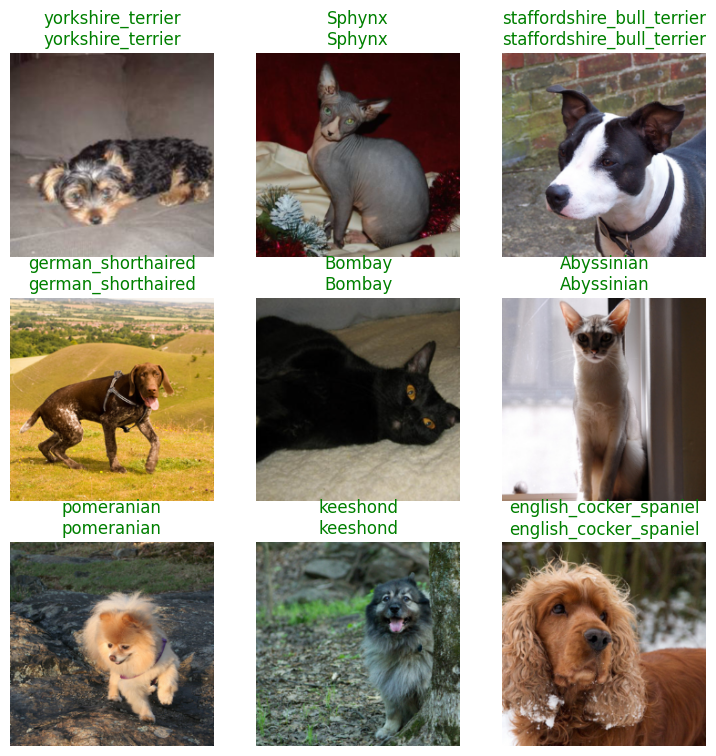

In [27]:
learn.show_results()

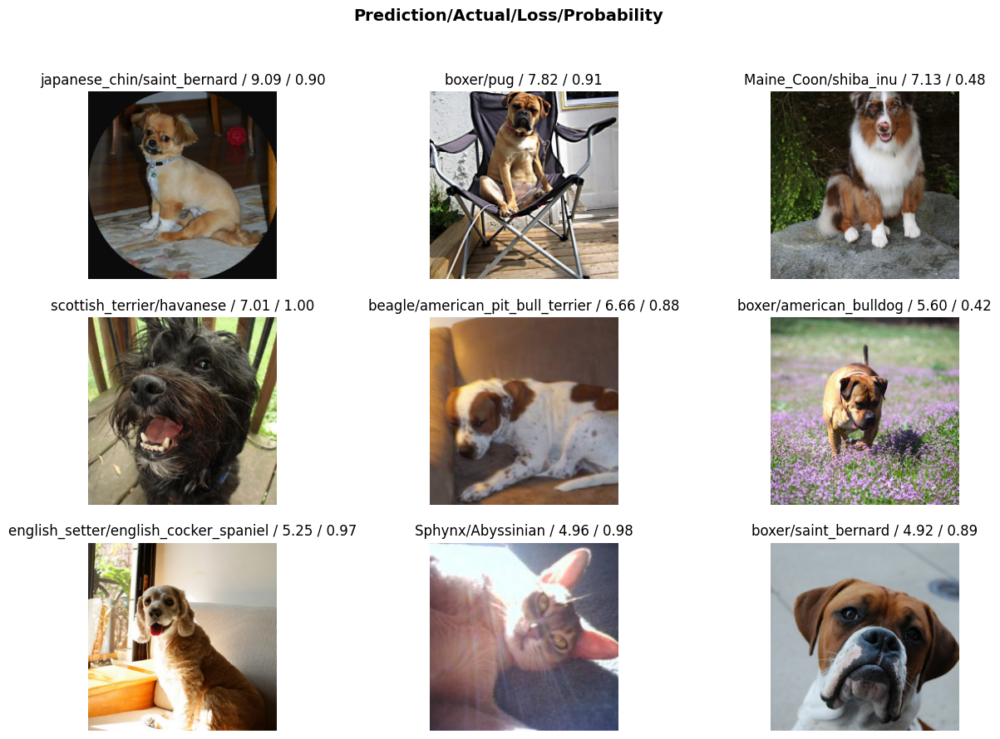

In [28]:
#another thing that is useful is interpretation object. it can sh0w us where the model made worse predictions

interp = Interpretation.from_learner(learn)
interp.plot_top_losses(9,figsize=(15,10))


#Single label classification- with the DataBlock API

In [29]:
#we can also use datablock api to get our data into dataloaders. 

pets = DataBlock(blocks=(ImageBlock, CategoryBlock),
                 get_items= get_image_files,
                 splitter = RandomSplitter(),
                 get_y = using_attr(RegexLabeller(r'(.+)_\d+.jpg$'),
                                    'name'),
                 item_tfms = Resize(460),
                 batch_tfms= aug_transforms(size=224))

#the pets object is itself empty, it only contains the methd that will help us gather the data

dls = pets.dataloaders(untar_data(URLs.PETS)/'images')


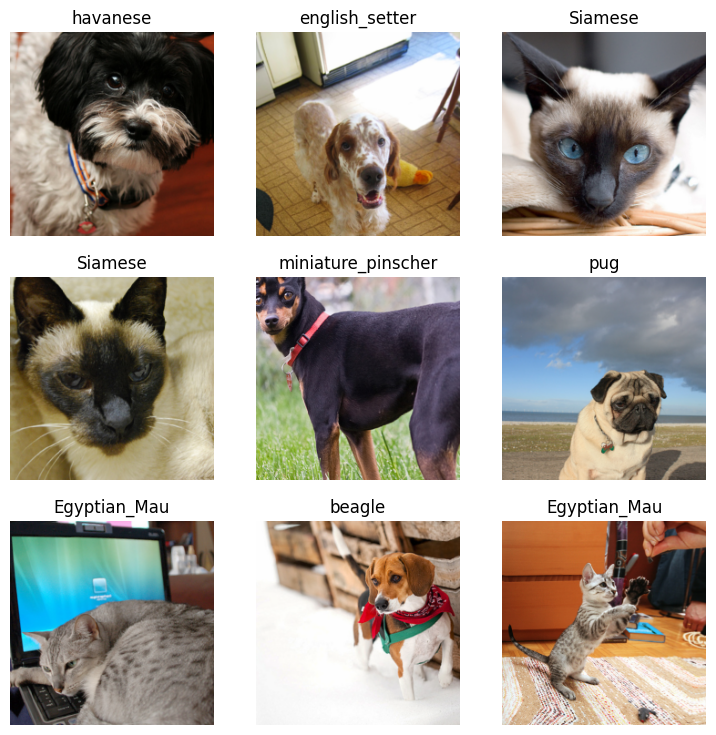

In [30]:

dls.show_batch()

#MultiLabel Classification

For this task, we will use the Pascal Dataset that contains images with different kinds of objects/persons. It’s orginally a dataset for object detection, meaning the task is not only to detect if there is an instance of one class of an image, but to also draw a bounding box around it. Here we will just try to predict all the classes in one given image.
Multi-label classification defers from before in the sense each image does not belong to one category. An image could have a person and a horse inside it for instance. Or have none of the categories we study.




In [31]:
#getting the dataset

path = untar_data(URLs.PASCAL_2007)
path.ls()

(#8) [Path('/root/.fastai/data/pascal_2007/valid.json'),Path('/root/.fastai/data/pascal_2007/test'),Path('/root/.fastai/data/pascal_2007/train.json'),Path('/root/.fastai/data/pascal_2007/train.csv'),Path('/root/.fastai/data/pascal_2007/train'),Path('/root/.fastai/data/pascal_2007/test.json'),Path('/root/.fastai/data/pascal_2007/test.csv'),Path('/root/.fastai/data/pascal_2007/segmentation')]

In [32]:
#the information about the labels of each image is in train.csv We load it using pandas:

df = pd.read_csv(path/'train.csv')
df.head()

,fname,labels,is_valid
0,000005.jpg,chair,True
1,000007.jpg,car,True
2,000009.jpg,horse person,True
3,000012.jpg,car,False
4,000016.jpg,bicycle,True


#Multi-label Classification using High-level API

Thats pretty straight forward, for each filename ,we get different labels(separated by space) and the last column tells us if it is in the validation set or not.  To get this in dataloaders, we have a factory method from_df, We can specify the underlying path where all the images are , an additional folder to add between the base path and the filename(here train), the valid_col to consider for validation set(if we dont specify this,we take a random subset), a label_delim to split the labels and as before, item_tfms and batch_tfms. 

In [33]:
dls = ImageDataLoaders.from_df(df, path, folder='train',valid_col='is_valid',label_delim=" ", item_tfms=Resize(460),batch_tfms=aug_transforms(size=224))



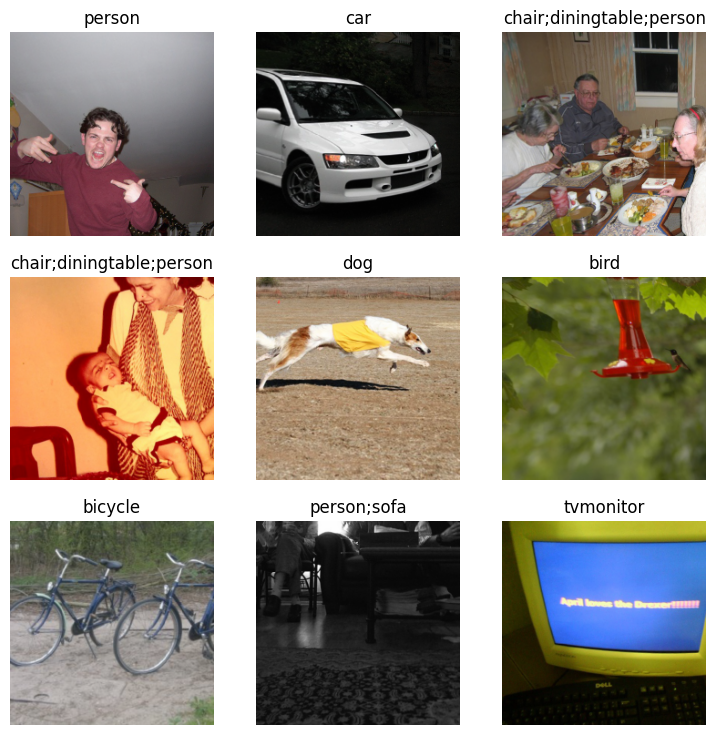

In [34]:
  dls.show_batch()

In [35]:
f1_macro = F1ScoreMulti(thresh=0.5,average='macro')
f1_macro.name = 'F1(macro)'
f1_samples = F1ScoreMulti(thresh=0.5,average='samples')
f1_samples.name = 'F1(samples)'
learn = vision_learner(dls, resnet50, metrics = [partial(accuracy_multi,thresh=0.5),f1_macro,f1_samples])


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 318MB/s]


SuggestedLRs(valley=0.0012022644514217973)

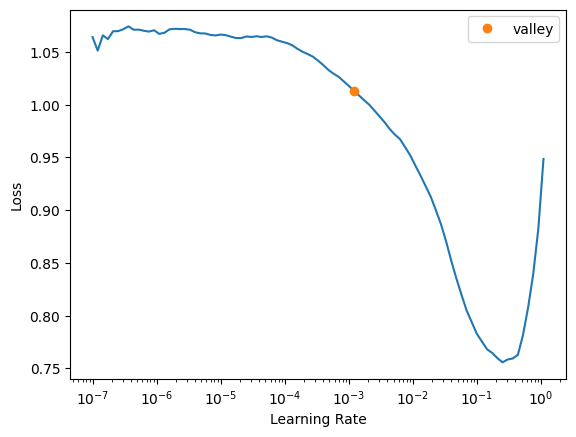

In [36]:
#picking a good learning rate

learn.lr_find()

In [37]:
#wecan pick the suggested learning rate
learn.fine_tune(2, 1e-3)

epoch,train_loss,valid_loss,accuracy_multi,F1(macro),F1(samples),time
0,0.914529,0.636781,0.678347,0.284768,0.310551,00:59


epoch,train_loss,valid_loss,accuracy_multi,F1(macro),F1(samples),time
0,0.725627,0.547761,0.747291,0.339791,0.371866,01:02
1,0.656355,0.497558,0.797211,0.384006,0.433396,01:02


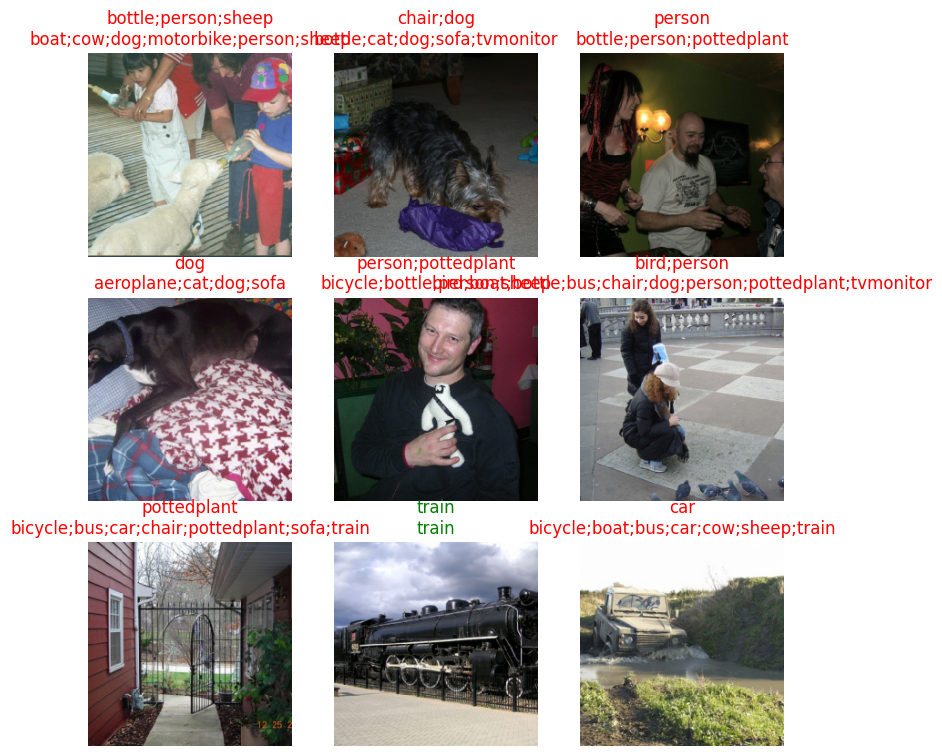

In [38]:
learn.show_results()

In [39]:
learn.predict(path/'train/000005.jpg')

((#6) ['bus','chair','diningtable','pottedplant','sofa','tvmonitor'],
 tensor([False, False, False, False, False,  True, False, False,  True, False,
          True, False, False, False, False,  True, False,  True, False,  True]),
 tensor([0.4441, 0.3939, 0.2976, 0.3954, 0.4056, 0.5060, 0.0302, 0.2752, 0.9991,
         0.3339, 0.9688, 0.1066, 0.2359, 0.1808, 0.3234, 0.6030, 0.3200, 0.8468,
         0.2004, 0.8170]))

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))


,target,predicted,probabilities,loss
0,chair;person,boat;chair;motorbike;pottedplant;sofa;train;tvmonitor,"tensor([0.4313, 0.3203, 0.4902, 0.5644, 0.2855, 0.2056, 0.4085, 0.2123, 0.9779,\n 0.3164, 0.3725, 0.1698, 0.0805, 0.5519, 0.0046, 0.6468, 0.1918, 0.9985,\n 0.5472, 0.7882])",1.0597847700119019
1,motorbike,bus;car;motorbike;person;sheep;sofa,"tensor([0.0807, 0.2130, 0.0511, 0.0757, 0.1650, 0.6117, 1.0000, 0.1631, 0.2788,\n 0.4189, 0.2471, 0.2497, 0.1581, 0.9967, 0.9446, 0.2975, 0.6174, 0.5824,\n 0.3139, 0.1409])",1.0350284576416016
2,bicycle;person,aeroplane;boat;bus;car;chair;cow;motorbike;sheep;sofa;train,"tensor([0.9423, 0.4534, 0.0776, 0.5110, 0.3384, 0.8068, 0.5801, 0.2585, 0.7113,\n 0.6327, 0.4628, 0.2324, 0.4843, 0.7318, 0.0323, 0.3185, 0.6181, 0.6931,\n 0.5338, 0.2986])",0.9924845099449158
3,dog,car;cat;chair;diningtable;dog;horse;sofa,"tensor([0.2504, 0.1295, 0.2599, 0.4580, 0.2242, 0.1950, 0.7855, 0.9995, 0.9005,\n 0.4085, 0.6812, 0.9007, 0.7355, 0.3463, 0.0152, 0.3587, 0.4305, 0.5762,\n 0.3423, 0.4551])",0.9881997108459473
4,bus;person,aeroplane;bicycle;bus;car,"tensor([0.6555, 0.5226, 0.3942, 0.2878, 0.1382, 0.9806, 0.9999, 0.1635, 0.1567,\n 0.2158, 0.3975, 0.3108, 0.2418, 0.4639, 0.0460, 0.2763, 0.4917, 0.3752,\n 0.1606, 0.3149])",0.9815065264701843
5,sofa,bus;cat;chair;diningtable;pottedplant;sofa;tvmonitor,"tensor([0.3388, 0.4657, 0.1801, 0.3671, 0.2626, 0.6079, 0.0990, 0.5157, 0.9946,\n 0.4417, 0.5341, 0.2573, 0.2705, 0.2278, 0.0564, 0.9022, 0.4660, 0.9695,\n 0.3781, 0.9845])",0.9443550109863281
6,sofa,bicycle;chair;diningtable;pottedplant;sheep;sofa;tvmonitor,"tensor([0.3861, 0.5810, 0.1831, 0.2801, 0.3851, 0.4855, 0.0781, 0.3720, 0.9916,\n 0.4337, 0.7587, 0.2358, 0.2718, 0.3549, 0.1948, 0.7777, 0.6110, 0.9719,\n 0.4012, 0.9831])",0.9332627654075623
7,person,aeroplane;bus;motorbike;train,"tensor([0.7814, 0.2729, 0.4026, 0.3421, 0.3298, 0.5022, 0.1041, 0.2170, 0.3770,\n 0.4798, 0.4868, 0.1767, 0.2243, 0.6435, 0.0497, 0.3519, 0.4248, 0.4129,\n 0.9979, 0.3398])",0.9310245513916016
8,boat;person,boat;bottle;chair;diningtable;motorbike;pottedplant;sheep;sofa,"tensor([0.0828, 0.4704, 0.1222, 0.7748, 0.5834, 0.2664, 0.3600, 0.4785, 0.8729,\n 0.3164, 0.9108, 0.2298, 0.3035, 0.5135, 0.2095, 0.9858, 0.6242, 0.7234,\n 0.1662, 0.4844])",0.9261218905448914


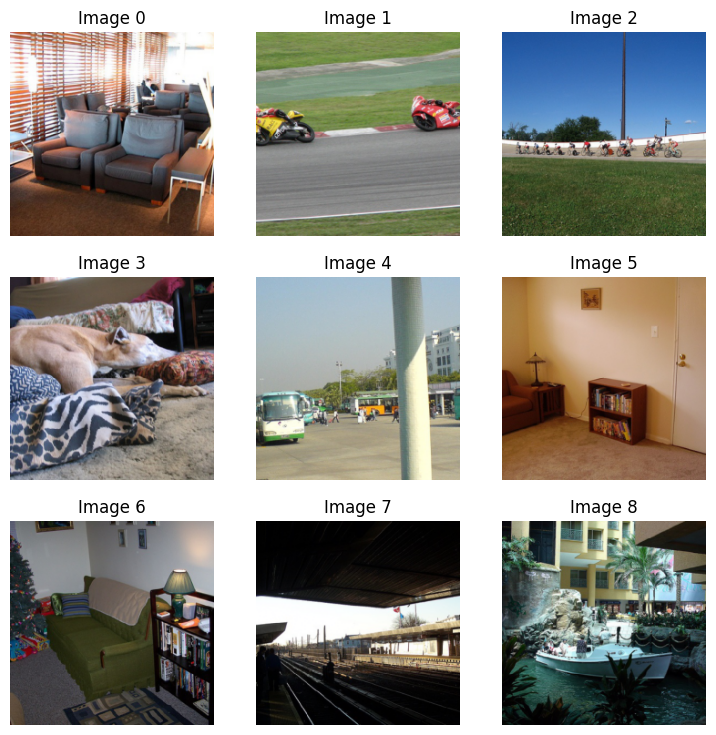

In [40]:
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(9)

#Multi-label classification with the data block API
  we can also use data block API to get our data in dataloaders
  

In [41]:
#remember how the data is structured?
df.head()

,fname,labels,is_valid
0,000005.jpg,chair,True
1,000007.jpg,car,True
2,000009.jpg,horse person,True
3,000012.jpg,car,False
4,000016.jpg,bicycle,True


In [42]:
pascal = DataBlock(blocks=(ImageBlock, MultiCategoryBlock),
                   splitter = ColSplitter('is_valid'),
                   get_x = ColReader('fname',pref=str(path/'train')+os.path.sep),
                   get_y = ColReader('labels',label_delim = ' '),
                   item_tfms = Resize(460),
                   batch_tfms = aug_transforms(size=224))

In [43]:
#like before, pascal is just a blueprint. we need to pass it the source of our data to be able to get dataloaders
dls = pascal.dataloaders(df)



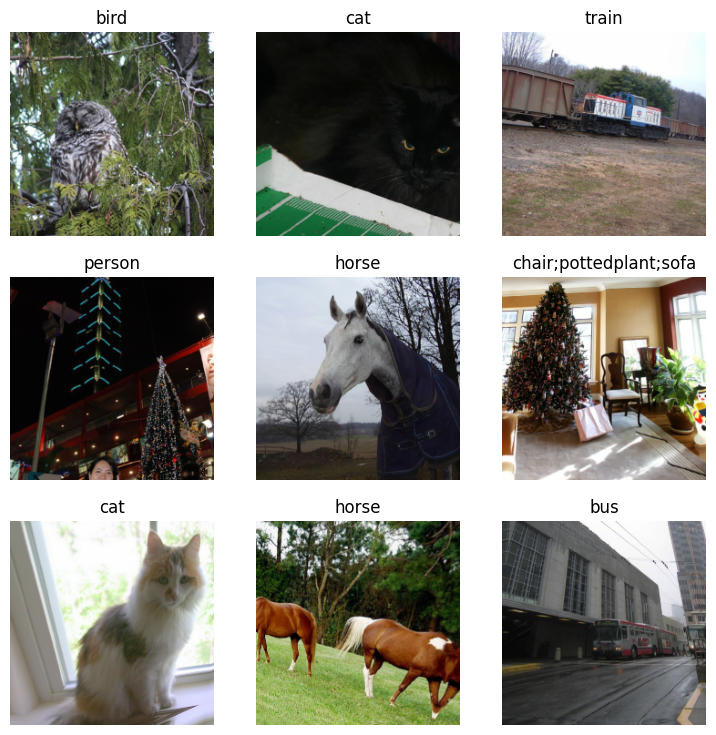

In [44]:
dls.show_batch(max_n=9)

#Segmentation

In [45]:
path = untar_data(URLs.CAMVID_TINY)
path.ls()

(#3) [Path('/root/.fastai/data/camvid_tiny/labels'),Path('/root/.fastai/data/camvid_tiny/images'),Path('/root/.fastai/data/camvid_tiny/codes.txt')]

In [46]:
codes = np.loadtxt(path/'codes.txt', dtype=str)
codes

array(['Animal', 'Archway', 'Bicyclist', 'Bridge', 'Building', 'Car',
       'CartLuggagePram', 'Child', 'Column_Pole', 'Fence', 'LaneMkgsDriv',
       'LaneMkgsNonDriv', 'Misc_Text', 'MotorcycleScooter', 'OtherMoving',
       'ParkingBlock', 'Pedestrian', 'Road', 'RoadShoulder', 'Sidewalk',
       'SignSymbol', 'Sky', 'SUVPickupTruck', 'TrafficCone',
       'TrafficLight', 'Train', 'Tree', 'Truck_Bus', 'Tunnel',
       'VegetationMisc', 'Void', 'Wall'], dtype='<U17')

In [47]:
fnames = get_image_files(path/"images")
fnames[0]

Path('/root/.fastai/data/camvid_tiny/images/0016E5_08101.png')

In [48]:
(path/"labels").ls()[0]

Path('/root/.fastai/data/camvid_tiny/labels/0016E5_07995_P.png')

In [49]:
def label_func(fn): return path/"labels"/f"{fn.stem}_P{fn.suffix}"

In [50]:
dls = SegmentationDataLoaders.from_label_func(
    path, bs=8, fnames = fnames, label_func = label_func, codes = codes
)

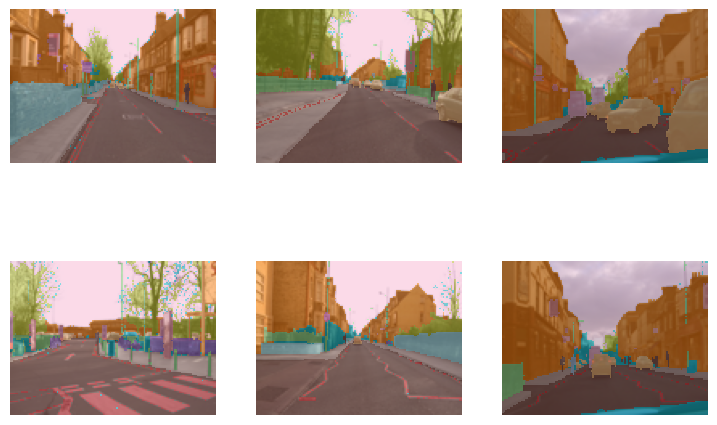

In [51]:
dls.show_batch(max_n=6)

In [52]:
learn = unet_learner(dls, resnet34)
learn.fine_tune(6)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,time
0,3.174068,2.740903,00:01


epoch,train_loss,valid_loss,time
0,2.156586,1.795656,00:01
1,1.804473,1.410846,00:01
2,1.564778,1.230329,00:01
3,1.390382,1.052832,00:01
4,1.246949,0.942171,00:02
5,1.137935,0.899455,00:02


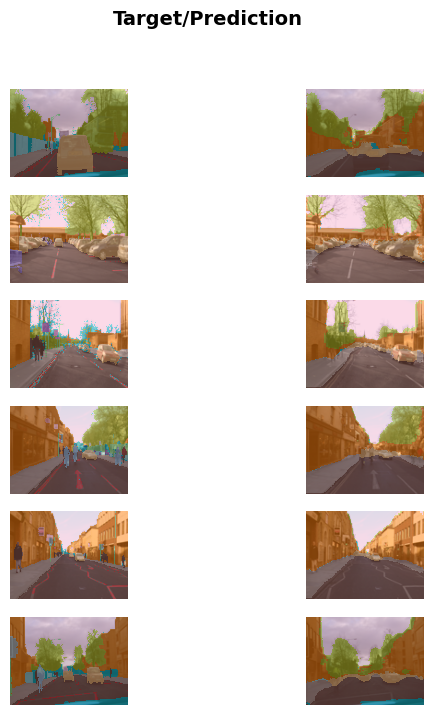

In [53]:
learn.show_results(max_n=6, figsize=(7,8))

#Segmentation - With the data block API

In [54]:
camvid = DataBlock(blocks=(ImageBlock, MaskBlock(codes)),
                   get_items = get_image_files,
                   get_y = label_func,
                   splitter=RandomSplitter(),
                   batch_tfms=aug_transforms(size=(120,160)))

In [55]:
dls = camvid.dataloaders(path/"images", path=path, bs=8)


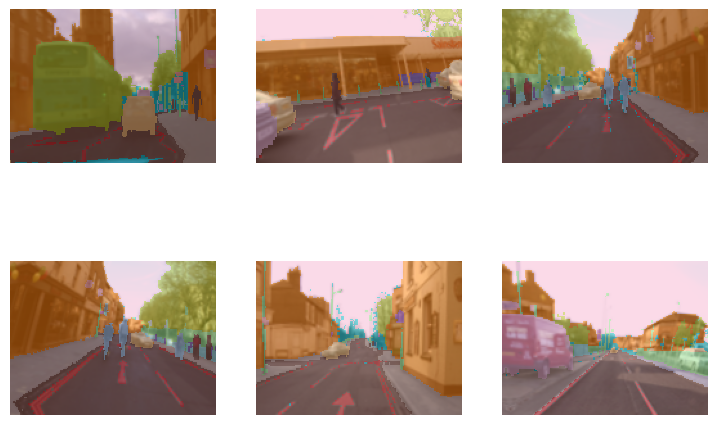

In [56]:
dls.show_batch(max_n=6)
